In [1]:
from diffusers import DiffusionPipeline
import torch

torch.manual_seed(0)

pipe = DiffusionPipeline.from_pretrained("SimianLuo/LCM_Dreamshaper_v7")
# To save GPU memory, torch.float16 can be used, but it may compromise image quality.
pipe.to(torch_device="cuda", torch_dtype=torch.float32)

prompt = "Self-portrait oil painting, a beautiful cyborg with golden hair, 8k"

# Can be set to 1~50 steps. LCM support fast inference even <= 4 steps. Recommend: 1~8 steps.
num_inference_steps = 4
images = pipe(prompt=prompt, num_inference_steps=num_inference_steps, guidance_scale=8.0, num_images_per_prompt=8).images
# images[0].save("image_original.png")

[2024-03-22 02:01:18,617] [INFO] [real_accelerator.py:158:get_accelerator] Setting ds_accelerator to cuda (auto detect)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

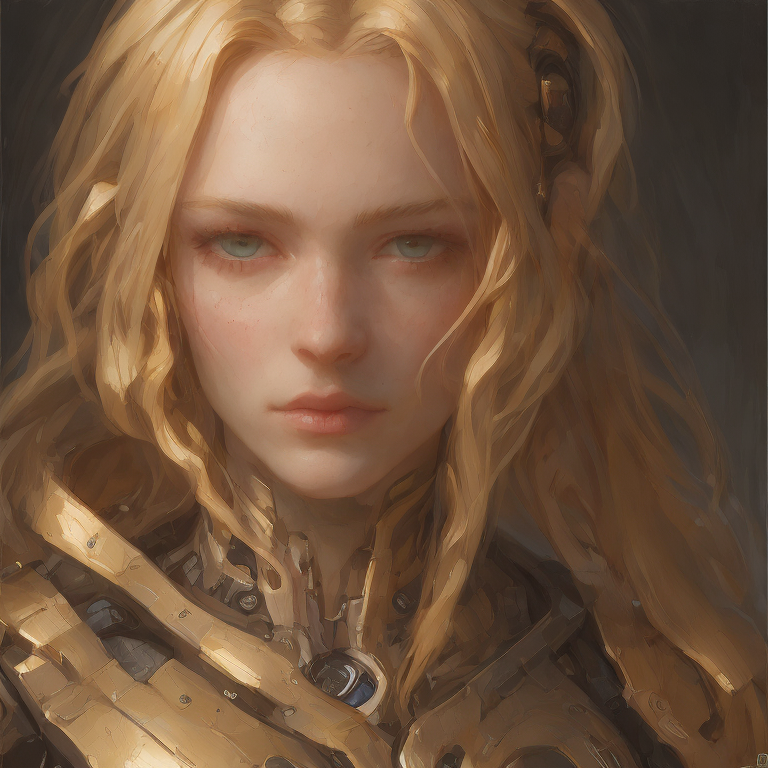

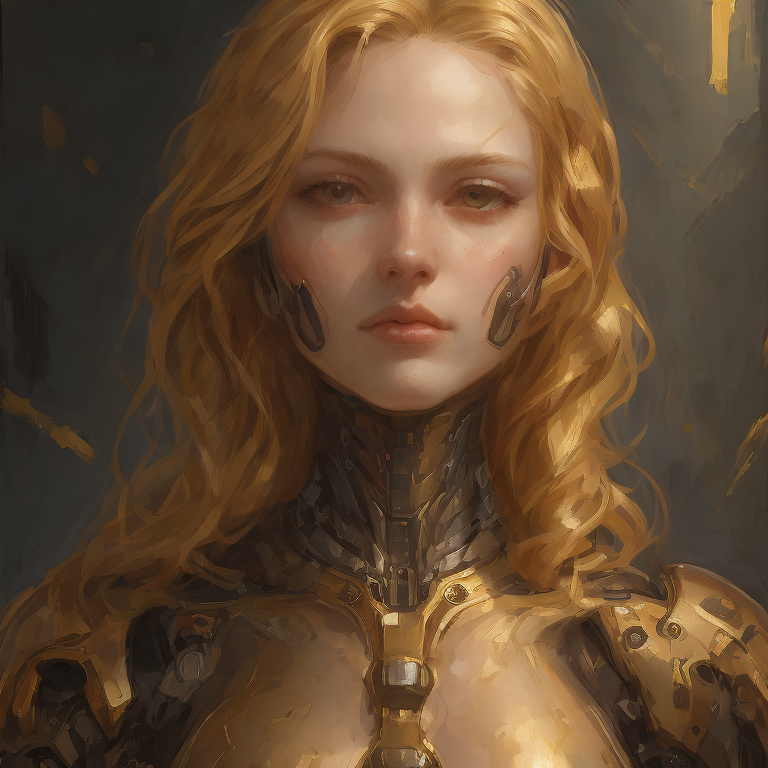

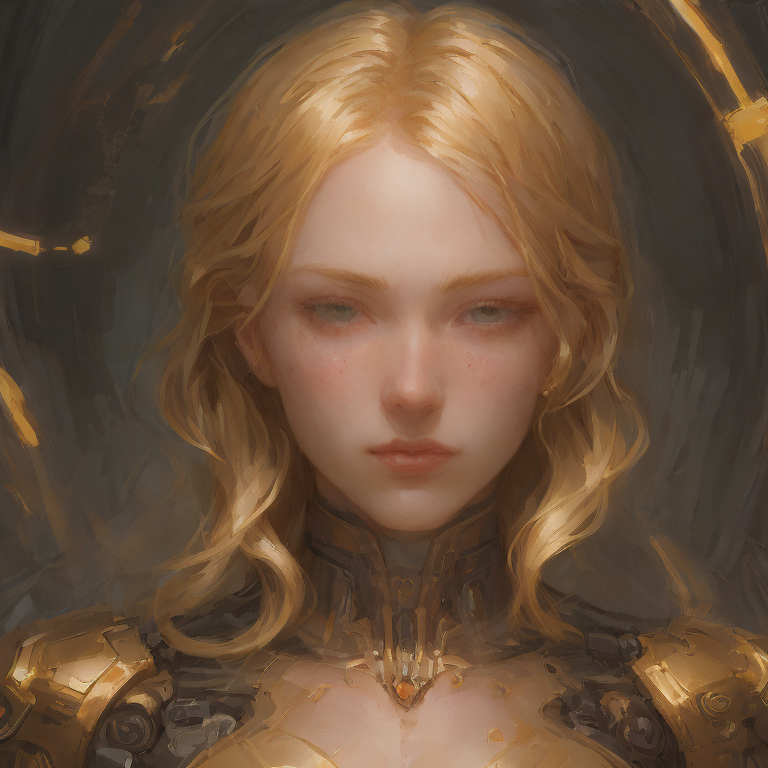

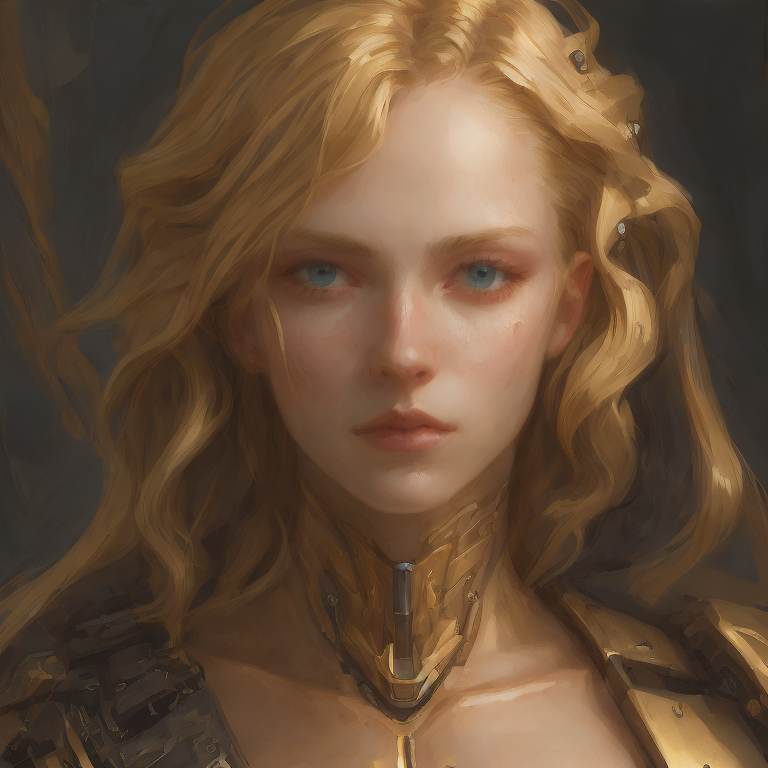

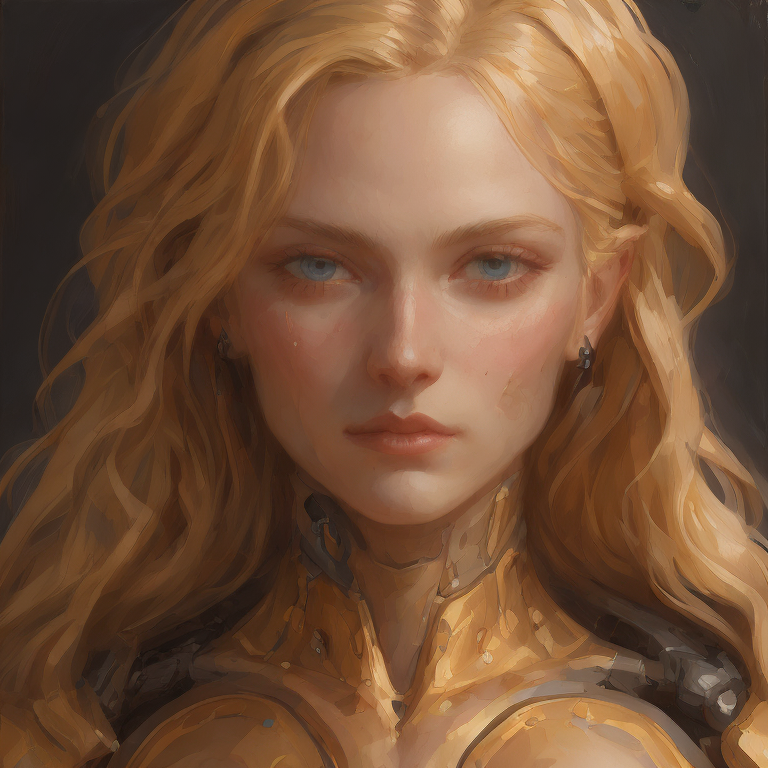

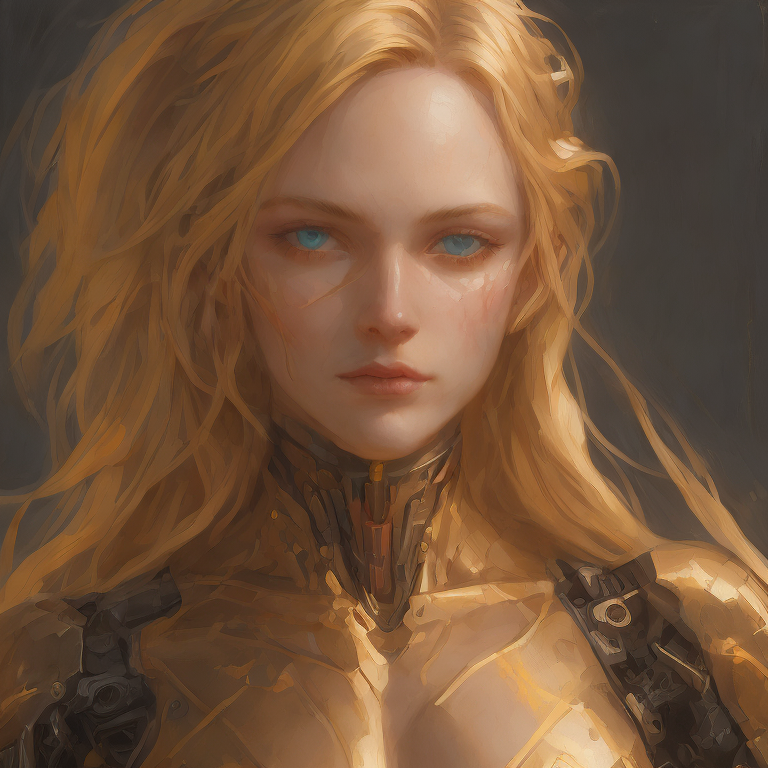

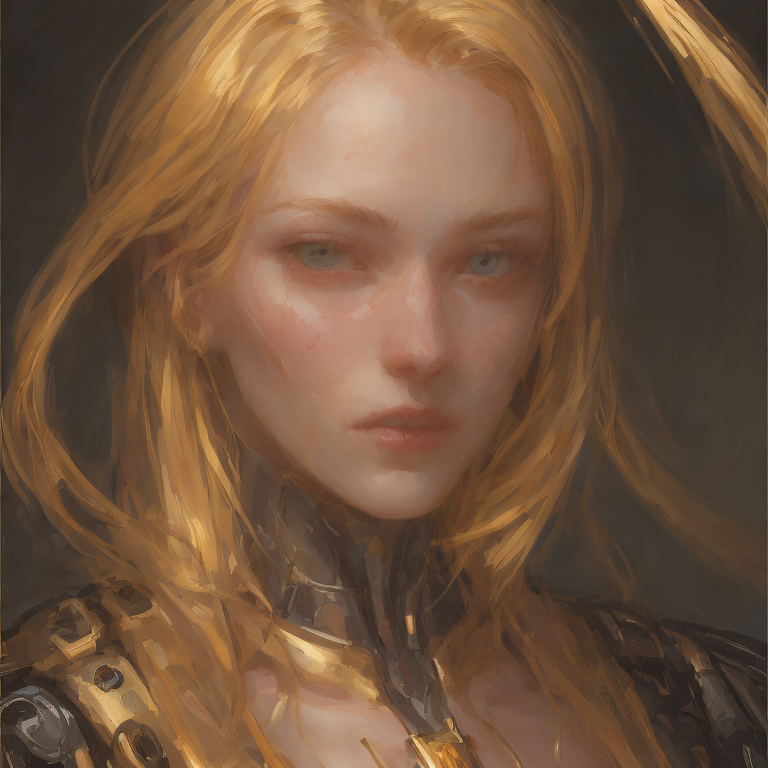

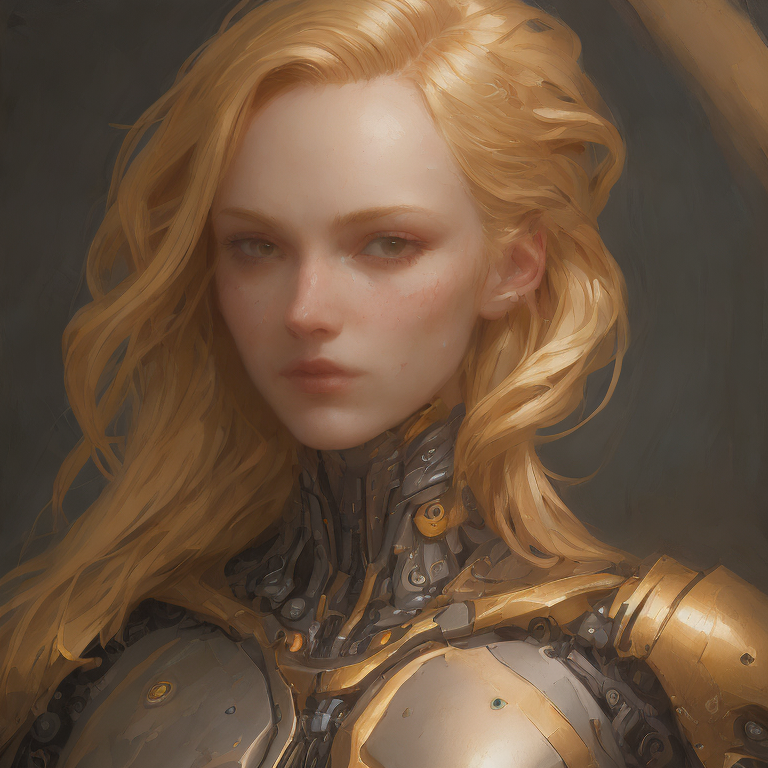

In [2]:
from IPython.display import display

for i in range(len(images)):
    images[i].save(f"my_tests_outputs/original_image_{i}.png")
    display(images[i])

### WARNING: Remember to reset the notebook between the original and modified runs, so that randn samples starting from the same initial latent

In [3]:
from functools import partial

def perturb_latents_callback(pipeline, i, t, callback_kwargs, step, max_images):
    latents = callback_kwargs["latents"]
    prompt_embeds = callback_kwargs["prompt_embeds"]
    w_embedding = callback_kwargs["w_embedding"]
    denoised = callback_kwargs["denoised"]

    batch_size = latents.shape[0]
    if batch_size < max_images:
        # TODO: Prohibit cloning and perturbing at the very last iteration
        print(f"End of iteration {i}: Current batch size is {batch_size}, doubling the batch size to {batch_size * 2}")
        latents = latents.repeat(2, 1, 1, 1)
        prompt_embeds = prompt_embeds.repeat(2, 1, 1)
        w_embedding = w_embedding.repeat(2, 1)
        denoised = denoised.repeat(2, 1, 1, 1)

        for j in range(batch_size, batch_size * 2):
            print(f"End of iteration {i}: Peturbing the latents in batch dimension {j}")
            latents[j] = latents[j] + torch.randn_like(latents[j]) * 0.2

    return {"latents": latents, "prompt_embeds": prompt_embeds, "w_embedding": w_embedding, "denoised": denoised}

from diffusers import DiffusionPipeline
import torch

torch.manual_seed(0)

pipe = DiffusionPipeline.from_pretrained("SimianLuo/LCM_Dreamshaper_v7")
# To save GPU memory, torch.float16 can be used, but it may compromise image quality.
pipe.to(torch_device="cuda", torch_dtype=torch.float32)

prompt = "Self-portrait oil painting, a beautiful cyborg with golden hair, 8k"

num_inference_steps = 4
images = pipe(prompt=prompt, num_inference_steps=num_inference_steps, guidance_scale=8.0,
              callback_on_step_end=partial(perturb_latents_callback, step=1, max_images=8), 
              callback_on_step_end_tensor_inputs=pipe._callback_tensor_inputs).images

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

End of iteration 0: Current batch size is 1, doubling the batch size to 2
End of iteration 0: Peturbing the latents in batch dimension 1
End of iteration 1: Current batch size is 2, doubling the batch size to 4
End of iteration 1: Peturbing the latents in batch dimension 2
End of iteration 1: Peturbing the latents in batch dimension 3
End of iteration 2: Current batch size is 4, doubling the batch size to 8
End of iteration 2: Peturbing the latents in batch dimension 4
End of iteration 2: Peturbing the latents in batch dimension 5
End of iteration 2: Peturbing the latents in batch dimension 6
End of iteration 2: Peturbing the latents in batch dimension 7
End of iteration 3: Current batch size is 8, doubling the batch size to 16
End of iteration 3: Peturbing the latents in batch dimension 8
End of iteration 3: Peturbing the latents in batch dimension 9
End of iteration 3: Peturbing the latents in batch dimension 10
End of iteration 3: Peturbing the latents in batch dimension 11
End of i

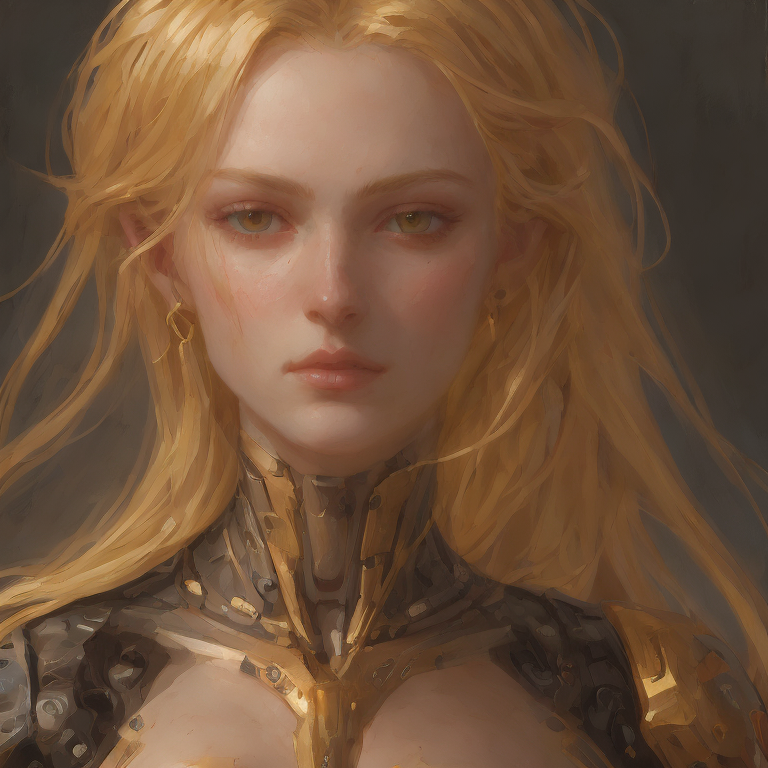

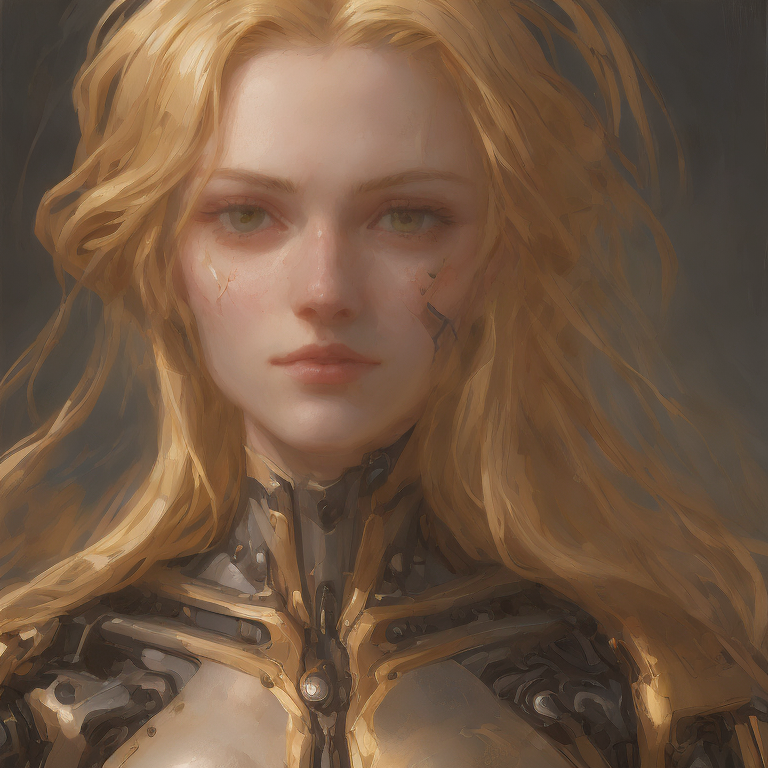

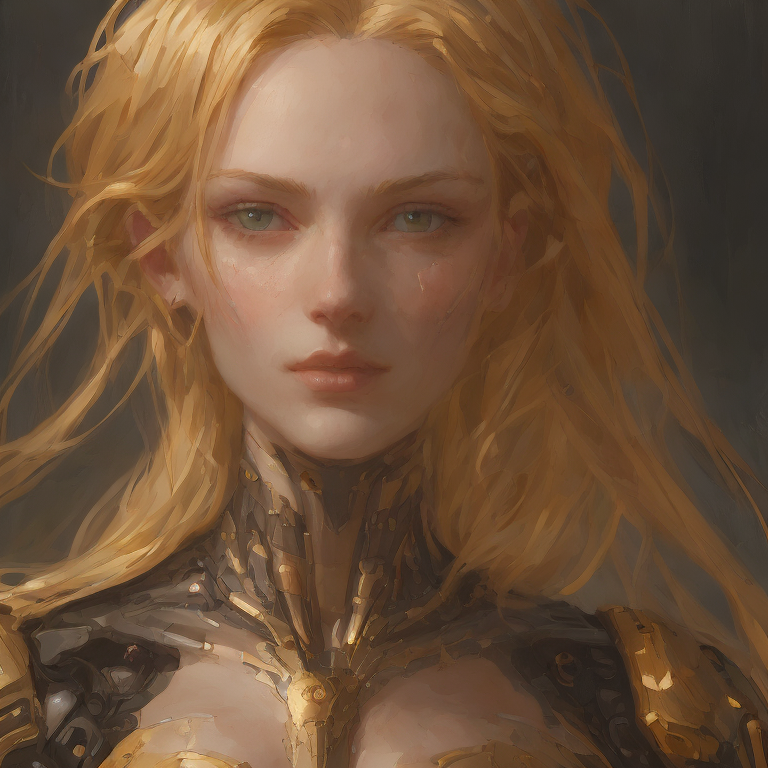

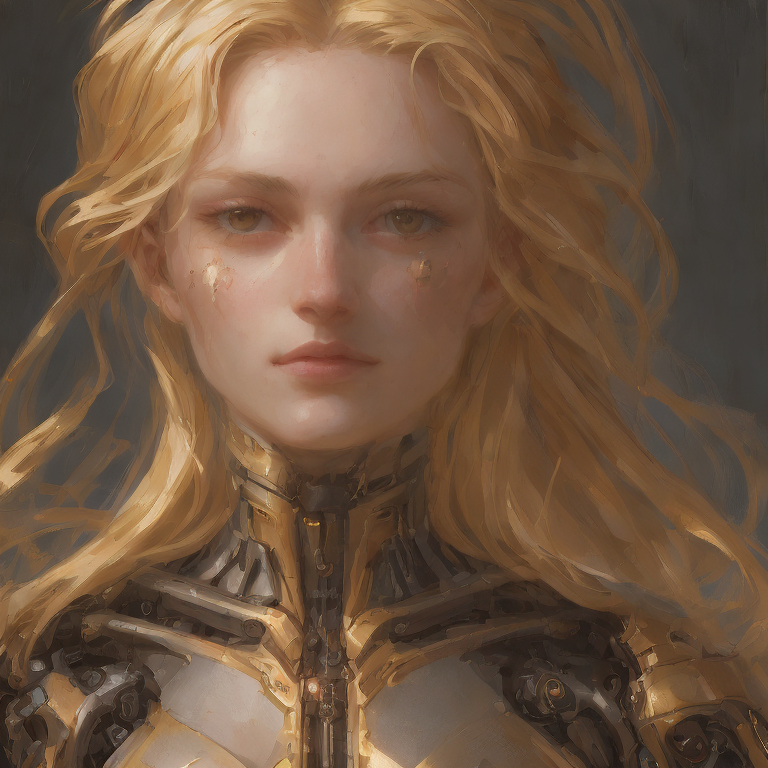

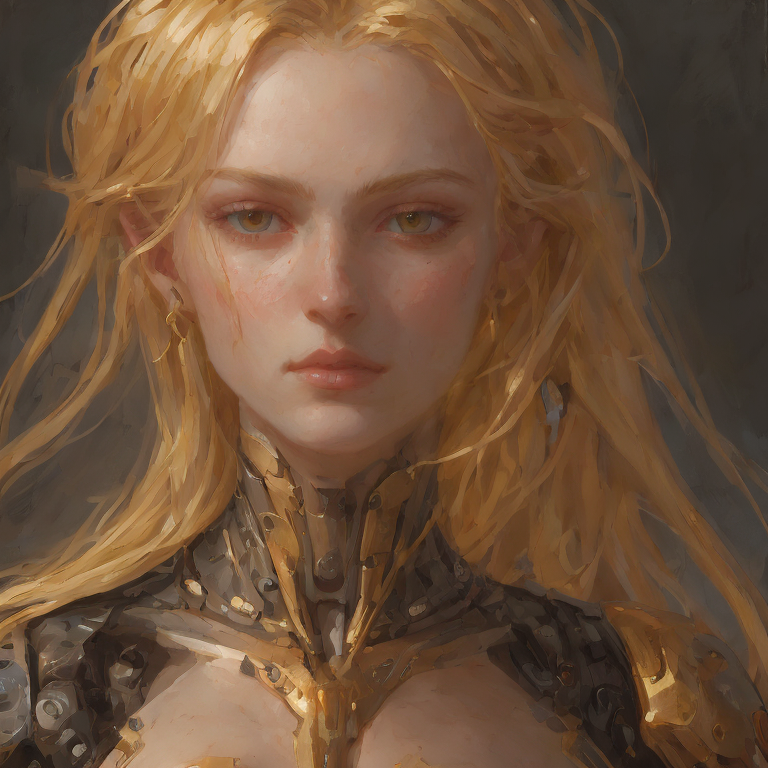

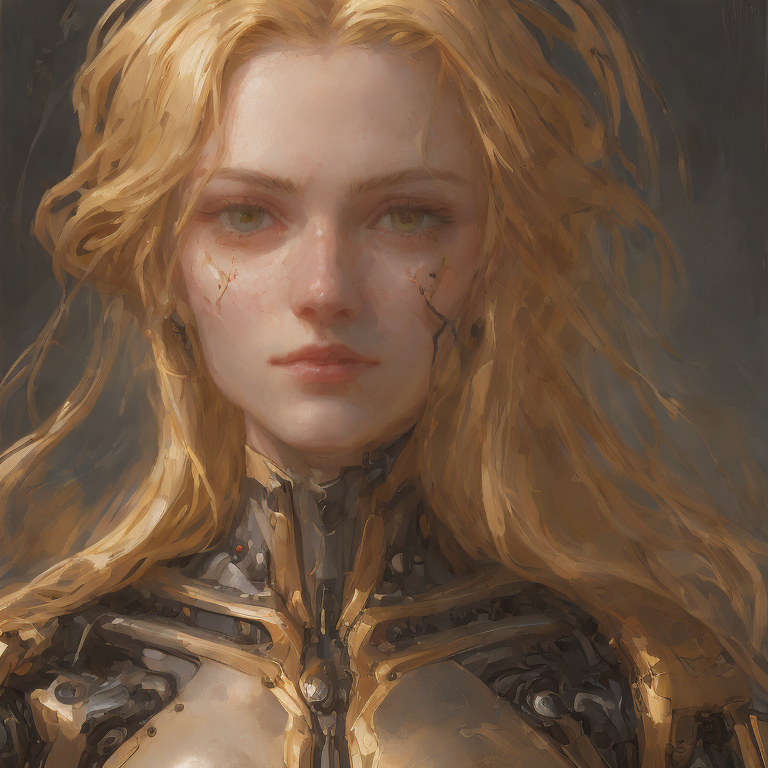

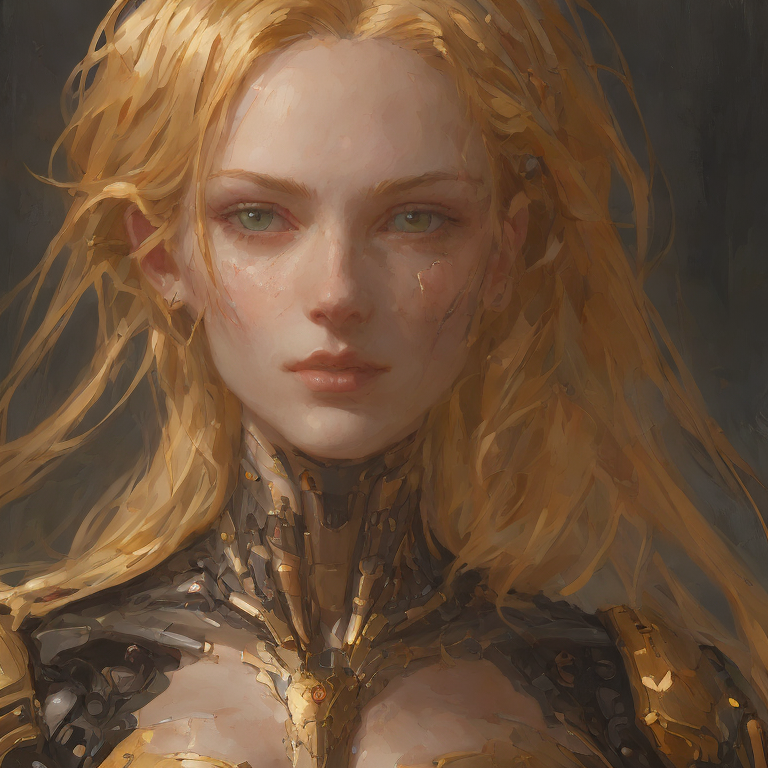

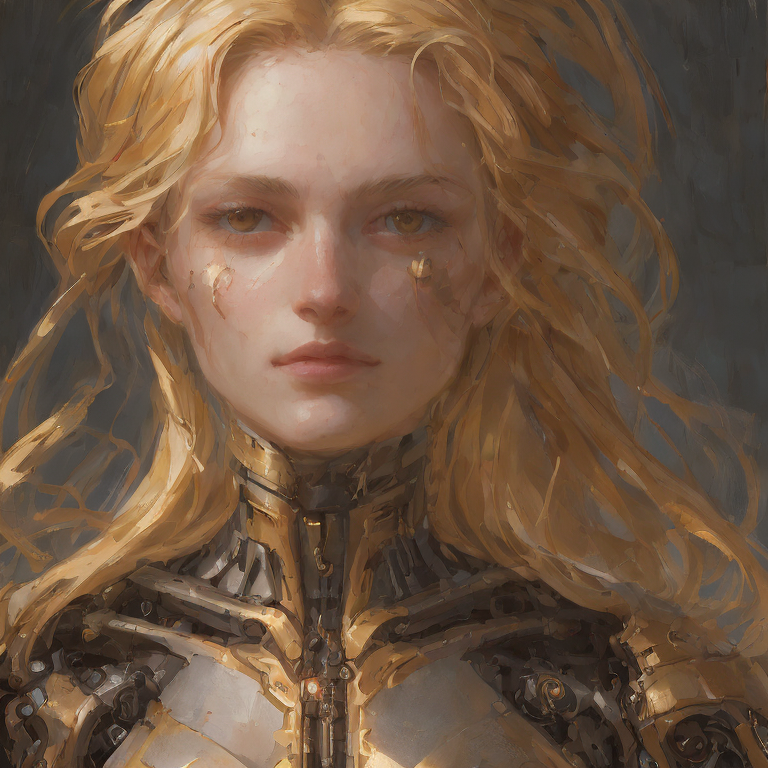

In [2]:
from IPython.display import display

for i in range(len(images)):
    images[i].save(f"my_tests_outputs/modified_image_{i}.png")
    display(images[i])

In [1]:
from functools import partial

def perturb_latents_callback(pipeline, i, t, callback_kwargs, step, max_images):
    latents = callback_kwargs["latents"]
    prompt_embeds = callback_kwargs["prompt_embeds"]
    w_embedding = callback_kwargs["w_embedding"]
    denoised = callback_kwargs["denoised"]

    batch_size = latents.shape[0]
    if batch_size < max_images:
        # TODO: Prohibit cloning and perturbing at the very last iteration
        print(f"End of iteration {i}: Current batch size is {batch_size}, doubling the batch size to {batch_size * 2}")
        latents = latents.repeat(2, 1, 1, 1)
        prompt_embeds = prompt_embeds.repeat(2, 1, 1)
        w_embedding = w_embedding.repeat(2, 1)
        denoised = denoised.repeat(2, 1, 1, 1)

        for j in range(batch_size, batch_size * 2):
            print(f"End of iteration {i}: Peturbing the latents in batch dimension {j}")
            latents[j] = latents[j] + torch.randn_like(latents[j]) * 0.2

    return {"latents": latents, "prompt_embeds": prompt_embeds, "w_embedding": w_embedding, "denoised": denoised}

from diffusers import StableDiffusionXLPipeline
import torch

pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16
)

torch.manual_seed(0)

# To save GPU memory, torch.float16 can be used, but it may compromise image quality.
pipe.to(torch_device="cuda")

prompt = "Self-portrait oil painting, a beautiful cyborg with golden hair, 8k"

num_inference_steps = 4
images = pipe(prompt=prompt, num_inference_steps=num_inference_steps, guidance_scale=8.0,
              callback_on_step_end=partial(perturb_latents_callback, step=1, max_images=8), 
              callback_on_step_end_tensor_inputs=pipe._callback_tensor_inputs).images

[2024-03-22 02:29:11,247] [INFO] [real_accelerator.py:158:get_accelerator] Setting ds_accelerator to cuda (auto detect)


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

(…)_1_0/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

RuntimeError: "LayerNormKernelImpl" not implemented for 'Half'

In [ ]:
from IPython.display import display

for i in range(len(images)):
    images[i].save(f"my_tests_outputs/sdxl_modified_image_{i}.png")
    display(images[i])